In [1]:
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential, clone_model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras import utils
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import scipy
from scipy.spatial import distance
import tensorflow as tf
import os
# from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras import backend as K

%matplotlib inline 

gpus = tf.config.list_physical_devices('GPU')
gpus

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [2]:
if gpus:
  # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
  try:
    for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)  # Для TensorFlow <2.4
            # или
            # tf.config.set_logical_device_configuration(
            #     gpu,
            #     [tf.config.LogicalDeviceConfiguration(memory_limit=4096)]  # Ограничение в MB
            # )

    # gpu_options = tf.GPUOptions(allow_growth=True)
    # session = tf.InteractiveSession(config=tf.ConfigProto(gpu_options=gpu_options))

    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Virtual devices must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPUs


In [3]:
K.clear_session()

Разобьем тестовую выборку на тестовую и валидационную:

In [4]:
# import os
# import shutil
# from sklearn.model_selection import train_test_split

# test_dir = "fruits-360/Test"

# test_split_dir = "Images/Test"
# val_split_dir = "Images/Validation"

# validation_split = 0.2

# for dir_path in [test_split_dir, val_split_dir]:
#     os.makedirs(dir_path, exist_ok=True)

# for class_name in os.listdir(test_dir):
#     class_path = os.path.join(test_dir, class_name)
#     if not os.path.isdir(class_path):
#         continue
    
#     os.makedirs(os.path.join(test_split_dir, class_name), exist_ok=True)
#     os.makedirs(os.path.join(val_split_dir, class_name), exist_ok=True)
    
#     images = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
#     train_images, val_images = train_test_split(images, test_size=validation_split, random_state=42)
    
#     for image in train_images:
#         shutil.copy(os.path.join(class_path, image), os.path.join(test_split_dir, class_name, image))
#     for image in val_images:
#         shutil.copy(os.path.join(class_path, image), os.path.join(val_split_dir, class_name, image))

print("Данные успешно разбиты на тестовую и валидационную выборки.")


Данные успешно разбиты на тестовую и валидационную выборки.


**Датасет не позволяет использовать большинство видов аугментации. Фото размещены впритык**

In [5]:

BATCH_SIZE = 80 # размер минибэтча.
IMG_SIZE = 360 # orig

dir = 'Images'
train_dir = os.path.join(dir, 'Training')
validation_dir = os.path.join(dir, 'Validation')
test_dir = os.path.join(dir, 'Test')

# def add_padding(image):
#     image = tf.convert_to_tensor(image)  # Преобразование в тензор
#     padding = 20
#     padded_image = np.pad(
#         image.numpy(),  # Преобразование обратно в NumPy для np.pad
#         ((padding, padding), (padding, padding), (0, 0)),
#         mode='constant',
#         constant_values=255
#     )
#     padded_image = tf.convert_to_tensor(padded_image)  # Обратно в тензор
#     resized_image = tf.image.resize(padded_image, (IMG_SIZE, IMG_SIZE))
#     return resized_image


train_image_generator = ImageDataGenerator(
    rescale=1./255,
    # shear_range=0.05,
    horizontal_flip=True,
    # fill_mode='constant',
    # cval=255,
)
validation_image_generator = ImageDataGenerator(rescale=1./255)
test_image_generator = ImageDataGenerator(rescale=1./255)

train_data_gen = train_image_generator.flow_from_directory(batch_size=BATCH_SIZE,
                                                          directory=train_dir,
                                                          shuffle=True,
                                                          target_size=(IMG_SIZE, IMG_SIZE),
                                                          class_mode='categorical')

Found 70491 images belonging to 141 classes.


In [6]:
classes = os.listdir(train_dir)
classes


['Apple 6',
 'Apple Braeburn 1',
 'Apple Crimson Snow 1',
 'Apple Golden 1',
 'Apple Golden 2',
 'Apple Golden 3',
 'Apple Granny Smith 1',
 'Apple hit 1',
 'Apple Pink Lady 1',
 'Apple Red 1',
 'Apple Red 2',
 'Apple Red 3',
 'Apple Red Delicious 1',
 'Apple Red Yellow 1',
 'Apple Red Yellow 2',
 'Apricot 1',
 'Avocado 1',
 'Avocado ripe 1',
 'Banana 1',
 'Banana Lady Finger 1',
 'Banana Red 1',
 'Beetroot 1',
 'Blueberry 1',
 'Cabbage white 1',
 'Cactus fruit 1',
 'Cantaloupe 1',
 'Cantaloupe 2',
 'Carambula 1',
 'Carrot 1',
 'Cauliflower 1',
 'Cherry 1',
 'Cherry 2',
 'Cherry Rainier 1',
 'Cherry Wax Black 1',
 'Cherry Wax Red 1',
 'Cherry Wax Yellow 1',
 'Chestnut 1',
 'Clementine 1',
 'Cocos 1',
 'Corn 1',
 'Corn Husk 1',
 'Cucumber 1',
 'Cucumber 3',
 'Cucumber Ripe 1',
 'Cucumber Ripe 2',
 'Dates 1',
 'Eggplant 1',
 'Eggplant long 1',
 'Fig 1',
 'Ginger Root 1',
 'Granadilla 1',
 'Grape Blue 1',
 'Grape Pink 1',
 'Grape White 1',
 'Grape White 2',
 'Grape White 3',
 'Grape White

In [7]:

val_data_gen = validation_image_generator.flow_from_directory(batch_size=BATCH_SIZE,
                                                              directory=validation_dir,
                                                              shuffle=False,
                                                              target_size=(IMG_SIZE,IMG_SIZE),
                                                              class_mode='categorical')


Found 4788 images belonging to 141 classes.


In [8]:
sample_training_images, labels = next(train_data_gen)
labels.shape

(80, 141)

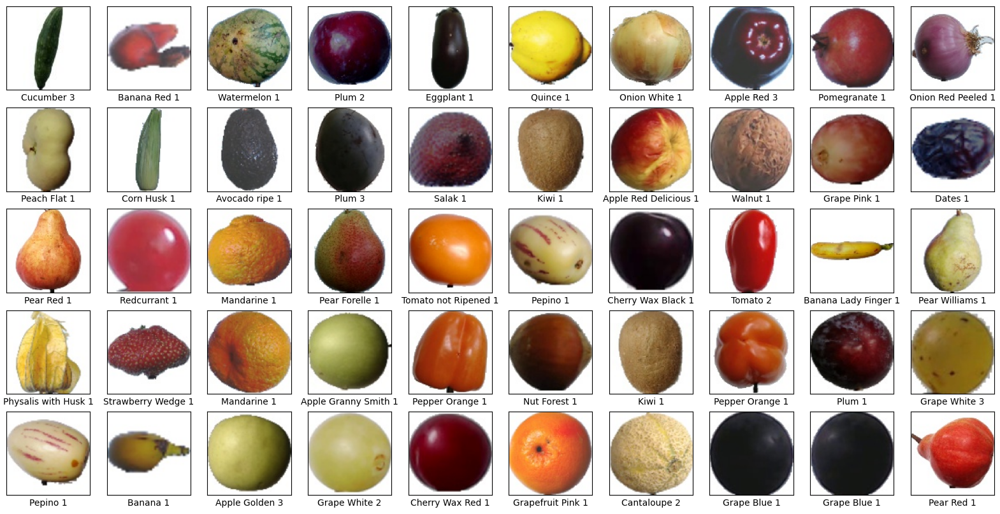

In [9]:
c50 = [classes[i] for i in np.argmax(labels[0:50].astype(int), axis=1)]
plt.figure(figsize=(20, 10))  # Увеличиваем размер фигуры для 50 изображений
for i in range(50):
    plt.subplot(5, 10, i + 1)  # Располагаем изображения в сетке 5x10
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(sample_training_images[i])
    plt.xlabel(c50[i])
plt.show()

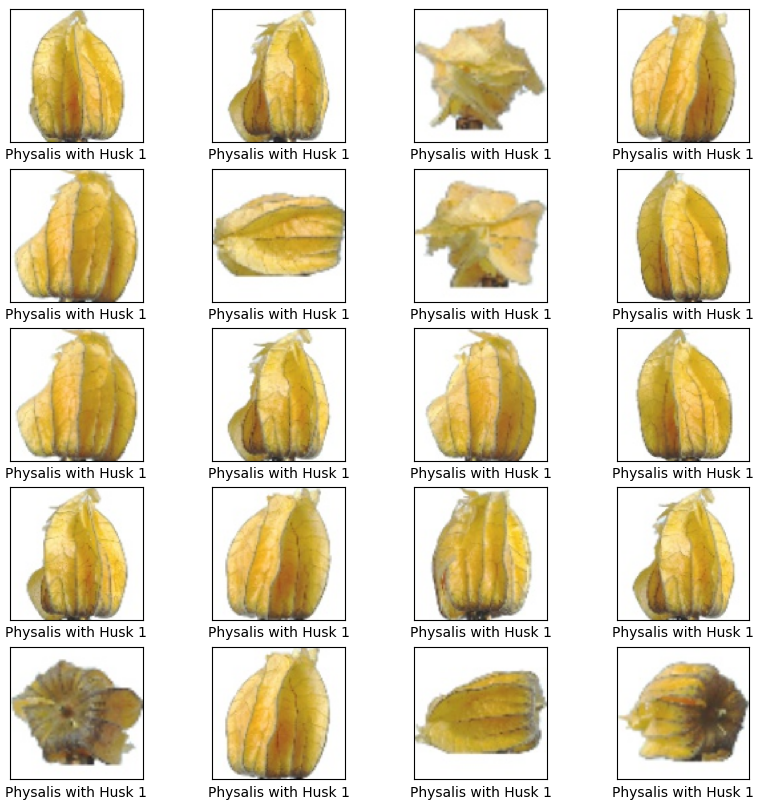

In [10]:
target_images = []
target_class = "Physalis with Husk 1"
target_index = classes.index(target_class)

for batch_images, batch_labels in train_data_gen:
    indices = np.where(np.argmax(batch_labels, axis=1) == target_index)[0]
    for idx in indices:
        target_images.append(batch_images[idx])
        if len(target_images) >= 20:
            break
    if len(target_images) >= 20:
        break

plt.figure(figsize=(10, 10))
for i in range(len(target_images)):
    plt.subplot(5, 4, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(target_images[i])
    plt.xlabel(target_class)
plt.show()


In [11]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

CLASS_CNT = len(classes)

def get_model():
    m = Sequential([
        # Первый сверточный слой
        Conv2D(32, (3, 3), input_shape=(IMG_SIZE, IMG_SIZE, 3), activation='relu'),
        # Первый слой подвыборки
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
        # 2 
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
        # 3
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
        # 4
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
        # Слой преобразования данных из 2D представления в плоское
        Flatten(),
        # Полносвязный слой для классификации
        Dense(512, activation='relu'),
        Dropout(.5),
        # Выходной полносвязный слой 
        Dense(CLASS_CNT, activation='softmax')
    ])
    m.compile(
        loss='categorical_crossentropy',
        optimizer='adam',
        metrics=['accuracy']
    )
    return m


In [12]:
model = get_model()

In [13]:
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 358, 358, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 179, 179, 32)      0         
_________________________________________________________________
dropout (Dropout)            (None, 179, 179, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 177, 177, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 88, 88, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 88, 88, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 86, 86, 128)       7

In [14]:
EPOCHS = 80
history = model.fit(
    train_data_gen,
    steps_per_epoch=int(np.ceil(len(train_data_gen) / float(BATCH_SIZE))),
    epochs=EPOCHS,
    validation_data=val_data_gen, 
    validation_steps=int(np.ceil(len(train_data_gen) / float(BATCH_SIZE)))
)

Epoch 1/80
12/12 [==============================] - 24s 1s/step - loss: 5.6953 - accuracy: 0.0063 - val_loss: 4.9493 - val_accuracy: 0.0000e+00
Epoch 2/80
12/12 [==============================] - 9s 728ms/step - loss: 4.9408 - accuracy: 0.0094 - val_loss: 4.9486 - val_accuracy: 0.0000e+00
Epoch 3/80
12/12 [==============================] - 9s 717ms/step - loss: 4.9377 - accuracy: 0.0094 - val_loss: 4.9477 - val_accuracy: 0.0000e+00
Epoch 4/80
12/12 [==============================] - 9s 719ms/step - loss: 4.8890 - accuracy: 0.0271 - val_loss: 4.9029 - val_accuracy: 0.0000e+00
Epoch 5/80
12/12 [==============================] - 9s 705ms/step - loss: 4.8131 - accuracy: 0.0312 - val_loss: 4.8638 - val_accuracy: 0.0437
Epoch 6/80
12/12 [==============================] - 9s 695ms/step - loss: 4.6188 - accuracy: 0.0375 - val_loss: 4.8831 - val_accuracy: 0.0000e+00
Epoch 7/80
12/12 [==============================] - 9s 705ms/step - loss: 4.4568 - accuracy: 0.0344 - val_loss: 4.7778 - val_accur

In [15]:
def show_hist(history):
    history_dict = history.history
    acc_values = history_dict['accuracy']
    val_acc_values = history_dict['val_accuracy']
    epochs = range(1, len(acc_values) + 1)
    plt.figure(figsize=(10,6), dpi=180)
    plt.plot(epochs, val_acc_values, 'b', label='Validation')
    plt.plot(epochs, acc_values, 'r', label='Train')
    plt.xticks(epochs[::(int(len(epochs)/10) or 1)])
    plt.grid ( True )
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()


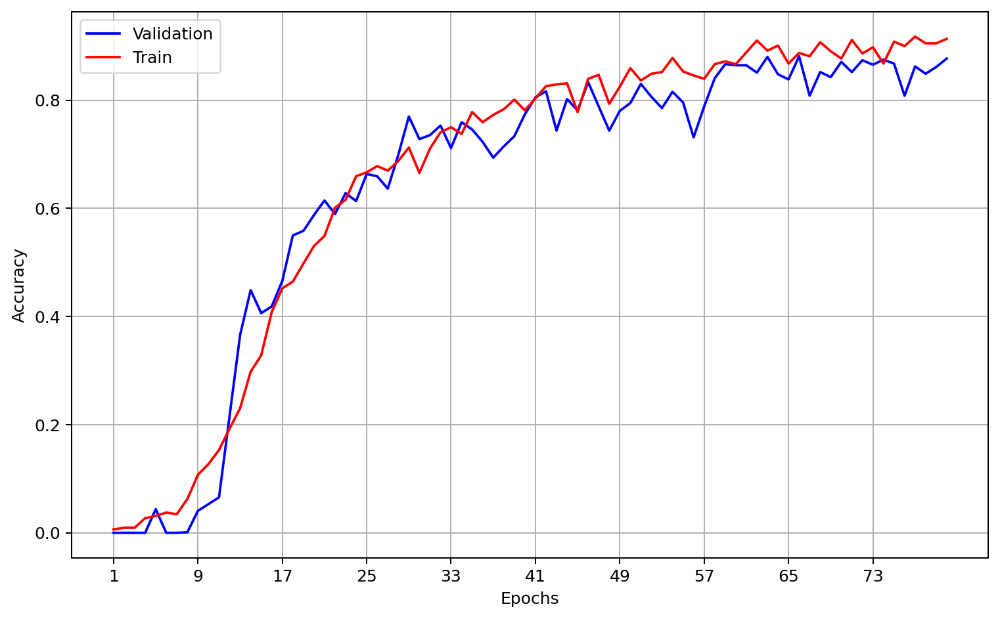

In [16]:
show_hist(history)

In [20]:
import os
from PIL import Image

def validate_images(directory):
    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            try:
                img = Image.open(file_path)
                img.verify()  # Проверка на корректность
            except Exception as e:
                print(f"Удаляю некорректный файл: {file_path}, ошибка: {e}")
                os.remove(file_path)  # Удалить файл

# Проверяем изображения перед созданием генератора
validate_images(test_dir)

Удаляю некорректный файл: Images\Test\Apple Pink Lady 1\273_100.jpg, ошибка: cannot identify image file 'Images\\Test\\Apple Pink Lady 1\\273_100.jpg'


In [21]:
test_data = test_image_generator.flow_from_directory(batch_size=BATCH_SIZE,
                                                              directory=test_dir,
                                                              shuffle=False,
                                                              target_size=(IMG_SIZE,IMG_SIZE),
                                                              class_mode='categorical')

Found 18830 images belonging to 141 classes.


In [22]:
scoreSeg = model.evaluate(test_data)

236/236 [==============================] - 1499s 6s/step - loss: 0.3528 - accuracy: 0.9097


In [23]:
print("%s%s: %.2f%%" % ("evaluate ",model.metrics_names[1], scoreSeg[1]*100))

evaluate accuracy: 90.97%


Как и на валидационном множестве.

In [24]:
p = model.predict(test_data)

In [27]:
print('predictions shape:', p.shape)

predictions shape: (18830, 141)


In [28]:
import numpy as np
from tqdm import tqdm

predictions = []

for i in tqdm(range(len(val_data_gen)), desc="Predicting"):
    # Получаем следующий батч изображений
    batch_images, _ = next(val_data_gen)
    batch_predictions = model.predict(batch_images)
    # Добавляем предсказания в общий список
    predictions.extend(batch_predictions)

predictions = np.array(predictions)

print('predictions shape:', predictions.shape)

Predicting: 100%|██████████| 60/60 [02:38<00:00,  2.64s/it]  

predictions shape: (4788, 141)


In [34]:
from sklearn.metrics import accuracy_score
predicted_classes = np.argmax(predictions, axis=1)
true_labels = val_data_gen.classes

# print(f"Predictions shape: {predicted_classes.shape}")
# print(f"True labels shape: {true_labels.shape}")
accuracy = accuracy_score(true_labels, predicted_classes)
print(f"Accuracy: {accuracy:.2f}")


Accuracy: 0.91


In [26]:
model.save("model.h5")

In [35]:
# наглядно
def test_model_show(model, data):
    n = 150 # 150 all
    n_classes = {v: k for k, v in data.class_indices.items()}
    plt.figure(figsize=(30, 50))

    data.batch_index = batch_index = 0

    while batch_index <= data.batch_index:
        imgs, labels = data.next()
        cn = [n_classes[i] for i in np.argmax(labels[0:10].astype(int), axis=1)]
        imgs = imgs[:10]
        p = model.predict(imgs)
        print(batch_index)
        for i in range(10):
            p_im = p[i]
            p_i = int(np.argmax(p_im))
            p_c = classes[p_i]
            p_n = p_im[p_i]        
            plt.subplot(int(n/10)+1, 10, batch_index*10 + i+1)
            plt.xticks([])
            plt.yticks([])
            plt.grid(False)
            plt.imshow(imgs[i])
            plt.xlabel(f'{cn[i]}; {p_c}({p_n:.2f})')
        batch_index = batch_index + 1


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16


ValueError: num must be an integer with 1 <= num <= 160, not 161

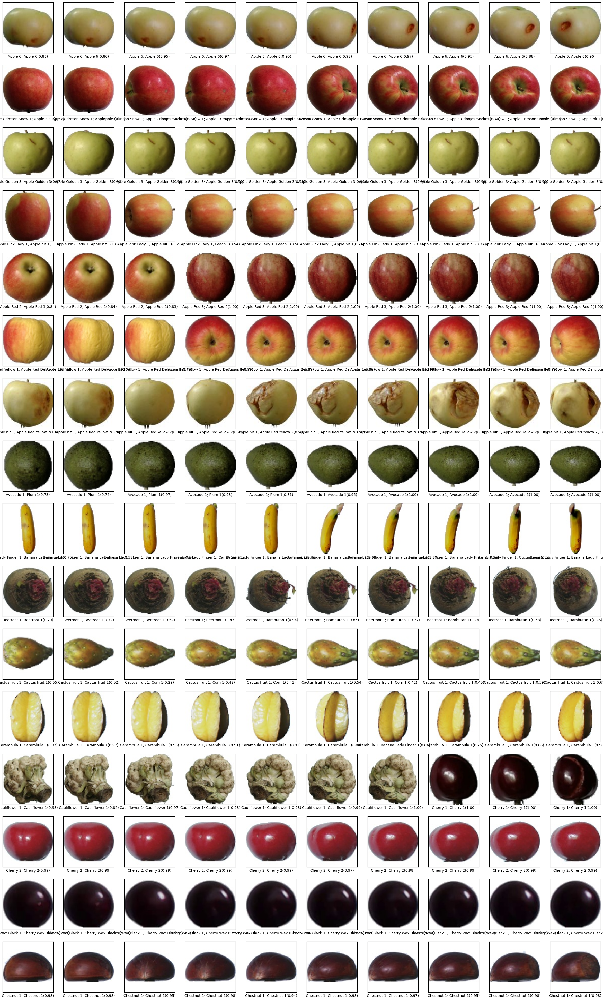

In [36]:
test_model_show(model, val_data_gen)

## Предсказание для одного изображения
- Подготовить изображение к форме, ожидаемой моделью (размер IMG_SIZE и масштабирование значений).
- Выполнить предсказание через model.predict.

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model

model = load_model("model.h5")

# Путь к изображению
image_path = "Images\Validation\Apple Crimson Snow 1\93_100.jpg"

# Загрузка и подготовка изображения
img = load_img(image_path, target_size=(IMG_SIZE, IMG_SIZE))  # Масштабируем размер
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Добавляем измерение для батча
img_array = img_array / 255.0  # Нормализуем

# Предсказание
predictions = model.predict(img_array)

predicted_class = np.argmax(predictions[0])  # Индекс класса с наибольшей вероятностью
print(f"Класс: {predicted_class}, вероятность: {predictions[0][predicted_class]:.2f}")